In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Глобальное окружение

## Подгрузим данные

In [2]:
os.listdir('../../data/anndata_objects/macaque')

['macaque.h5ad',
 'macaque_0701.h5ad',
 'macaque_0703.h5ad',
 'macaque_0704.h5ad',
 'macaque_nb0904.h5ad']

In [3]:
adata = sc.read_h5ad('../../data/anndata_objects/macaque/macaque.h5ad')
adata.obs_names_make_unique()
adata

c:\projects\spatialMPFC\venv\Lib\site-packages\anndata\_core\anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 14621 × 21591
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Оставим споты только с разметкой

In [4]:
adata = adata[adata.obs.label.notna()]

In [5]:
adata.obs.label.value_counts()

label
L3             4615
L5             2511
L4             1801
L1             1483
L6a            1348
L2             1196
Empty spots     681
L6b             513
WM              471
Name: count, dtype: int64

In [6]:
samples = list(adata.uns['spatial'].keys())
samples

['macaque_0701', 'macaque_0703', 'macaque_0704', 'macaque_nb0904']

## Посмотрим на изображения

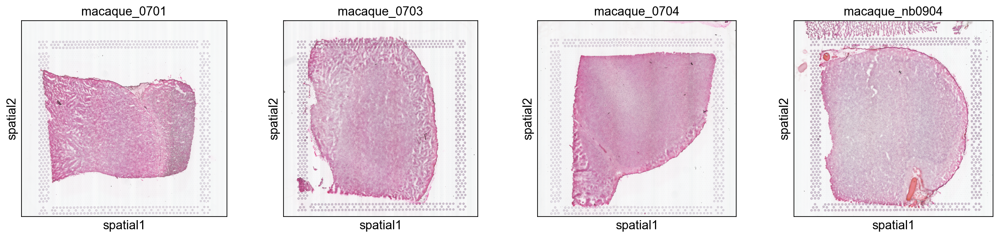

In [7]:
sq.pl.spatial_scatter(adata, library_key='sample_id', title=samples, ncols=5)

c:\projects\spatialMPFC\venv\Lib\site-packages\scanpy\plotting\_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


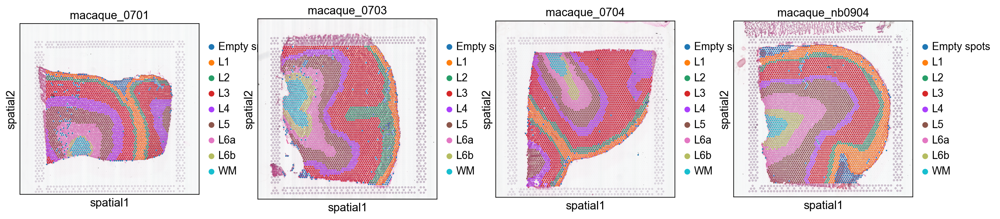

In [8]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

## Посмотрим на метрики

In [9]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

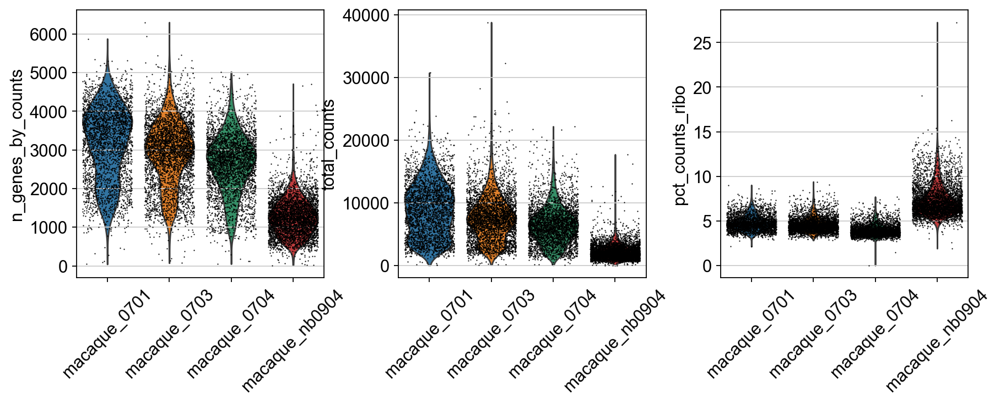

In [10]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'sample_id', rotation= 45)

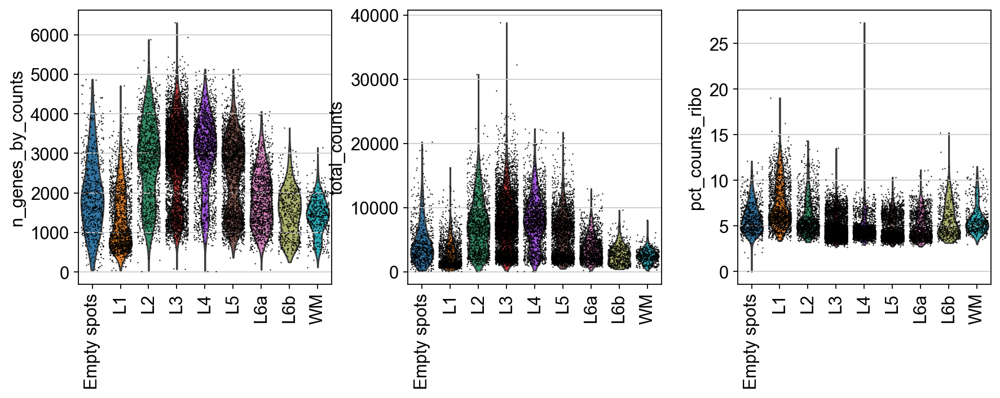

In [11]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'label', rotation= 90)

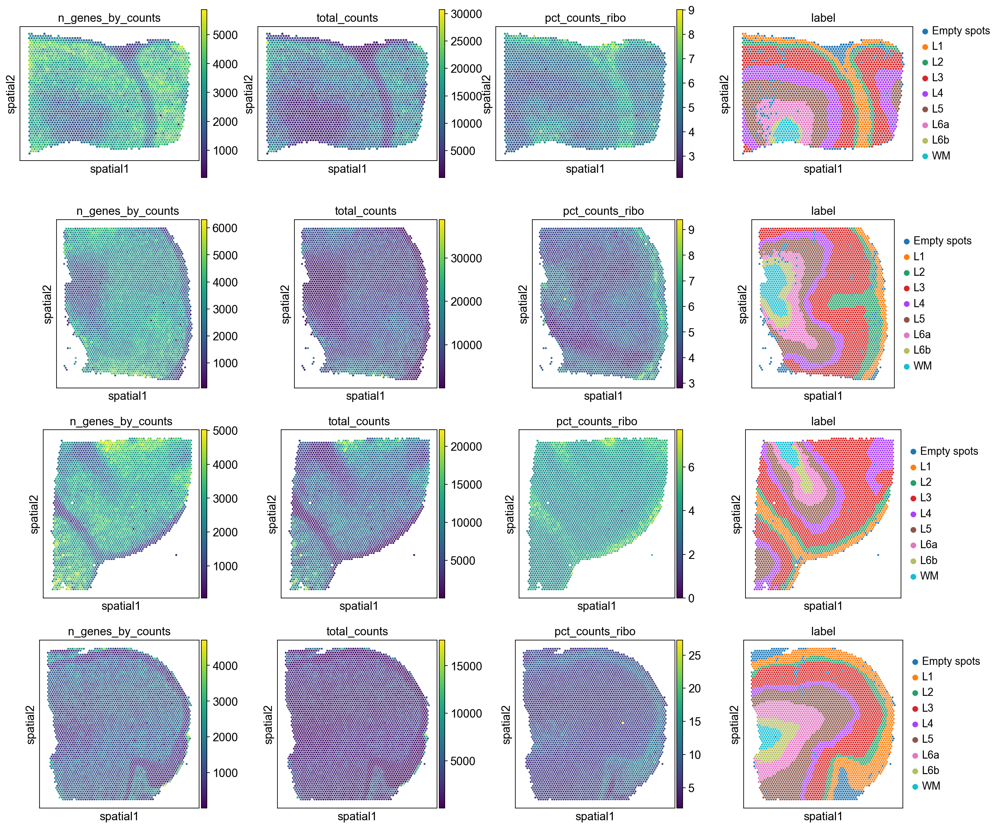

In [12]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'label'],
                      library_key='sample_id', ncols=4, img=False, size=1.3)

## PCA

In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell


    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:01:22)


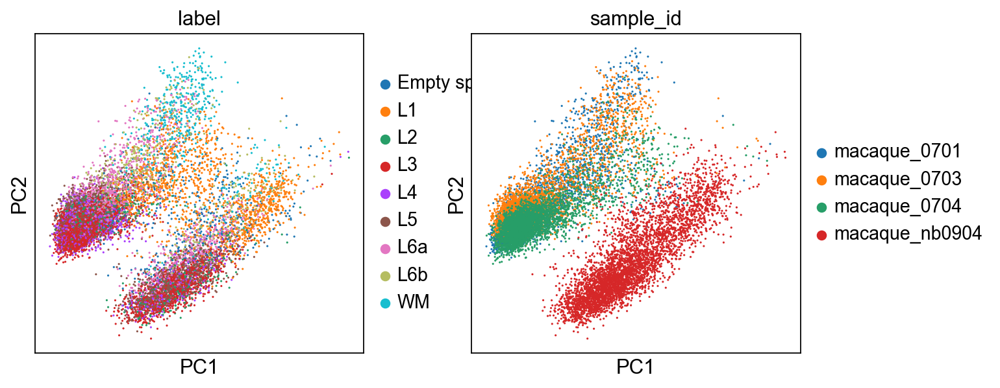

In [14]:
sc.pl.pca(adata, 
          color=['label', 'sample_id'],
          ncols=2, show=True)

### Дифф. экспрессия

In [15]:
remove = adata.var_names.str.startswith('MT-')
keep = np.invert(remove)
print(sum(remove))

adata = adata[:,keep]

0


In [16]:
adata.obs['cluster'] = adata.obs.label
adata.obs.cluster.replace({'L6a': 'L6', 'L6b': 'L6'}, inplace=True)
adata.obs.cluster.value_counts()

C:\Users\claptar\AppData\Local\Temp\ipykernel_26312\737622212.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['cluster'] = adata.obs.label


cluster
L3             4615
L5             2511
L6             1861
L4             1801
L1             1483
L2             1196
Empty spots     681
WM              471
Name: count, dtype: int64

In [17]:
sc.tl.rank_genes_groups(adata, groupby='cluster', method='wilcoxon', groups=['L1', 'WM', 'L6', 'L2', 'L3', 'L4', 'L5'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:29)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster']`


c:\projects\spatialMPFC\venv\Lib\site-packages\scanpy\tools\_dendrogram.py:190: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


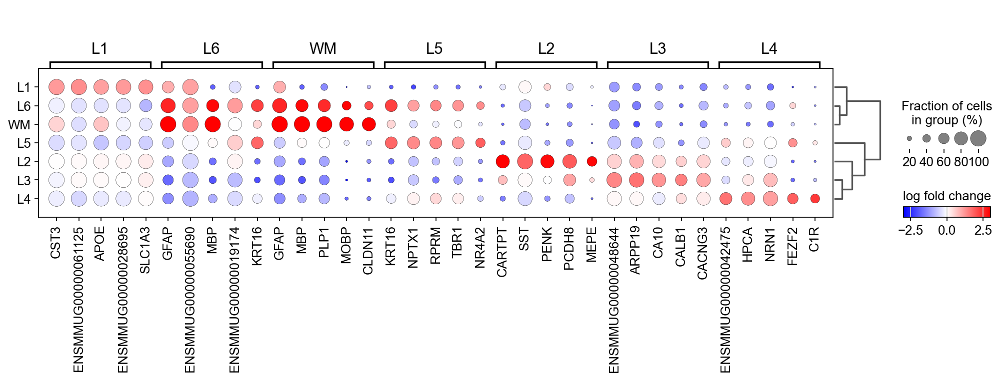

In [18]:
sc.pl.rank_genes_groups_dotplot(adata[adata.obs.cluster != 'Empty spots'],
                                groupby="cluster", n_genes=5, values_to_plot='logfoldchanges',
                                min_logfoldchange=1, vmax=3, vmin=-3, cmap='bwr', save='dotplot_fc_human.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster']`
categories: Empty spots, L1, L2, etc.
var_group_labels: L1, WM, L6, etc.


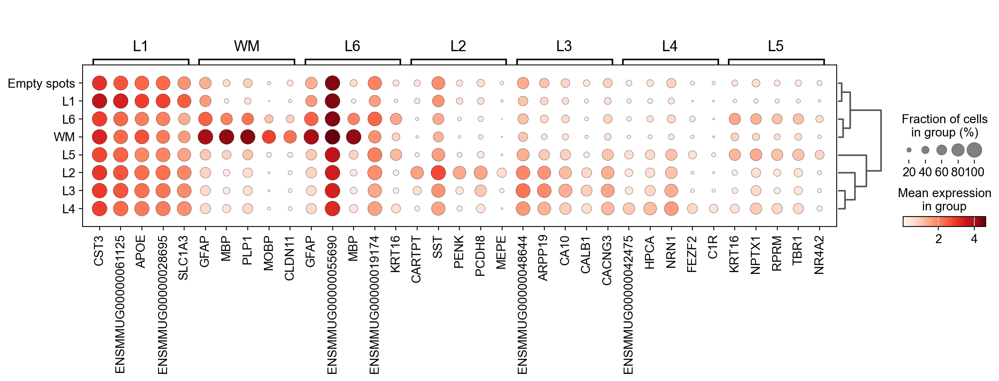

In [19]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby="cluster", min_logfoldchange=1, save='dotplot_expr_human.pdf')

## Spatial features

In [20]:
sq.gr.spatial_neighbors(
    adata, coord_type="generic", library_key="sample_id", delaunay=True
)

Creating graph using `generic` coordinates and `None` transform and `4` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:02)


Calculating neighborhood enrichment using `1` core(s)


100%|██████████| 1000/1000 [00:09<00:00, 109.61/s]


Adding `adata.uns['cluster_nhood_enrichment']`
Finish (0:00:10)


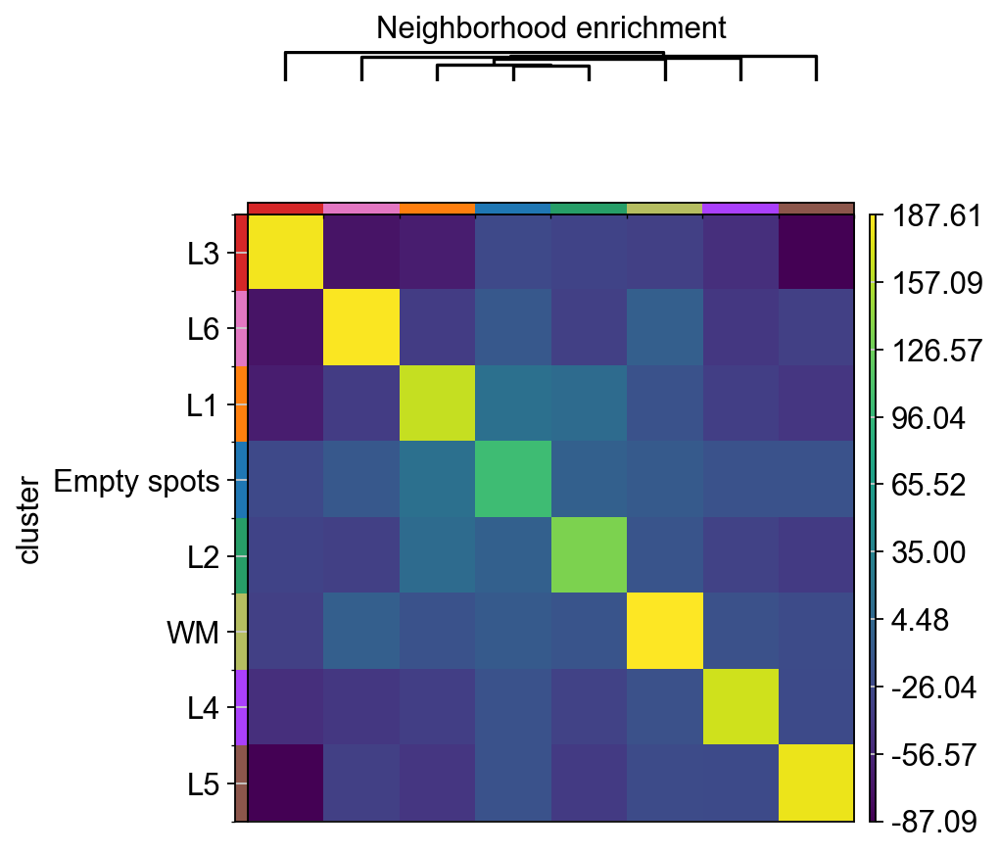

In [21]:
sq.gr.nhood_enrichment(adata, cluster_key="cluster")
sq.pl.nhood_enrichment(adata, cluster_key="cluster", method="average")

In [22]:
sq.gr.spatial_autocorr(adata, mode="moran", genes=adata.var_names)

c:\projects\spatialMPFC\venv\Lib\site-packages\scanpy\metrics\_common.py:62: UserWarning: 4107 variables were constant, will return nan for these.
  warnings.warn(


Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)


In [23]:
adata.uns["moranI"].head(15)

,I,pval_norm,var_norm,pval_norm_fdr_bh
HBA,0.794605,0.0,0.000023,NaN
ENSMMUG00000060590,0.783833,0.0,0.000023,NaN
ND3,0.777563,0.0,0.000023,NaN
MOBP,0.768471,0.0,0.000023,NaN
MBP,0.752650,0.0,0.000023,NaN
PTGDS,0.684946,0.0,0.000023,NaN
ND2,0.678769,0.0,0.000023,NaN
PLP1,0.656896,0.0,0.000023,NaN
ENSMMUG00000055690,0.644327,0.0,0.000023,NaN
COX3,0.629894,0.0,0.000023,NaN


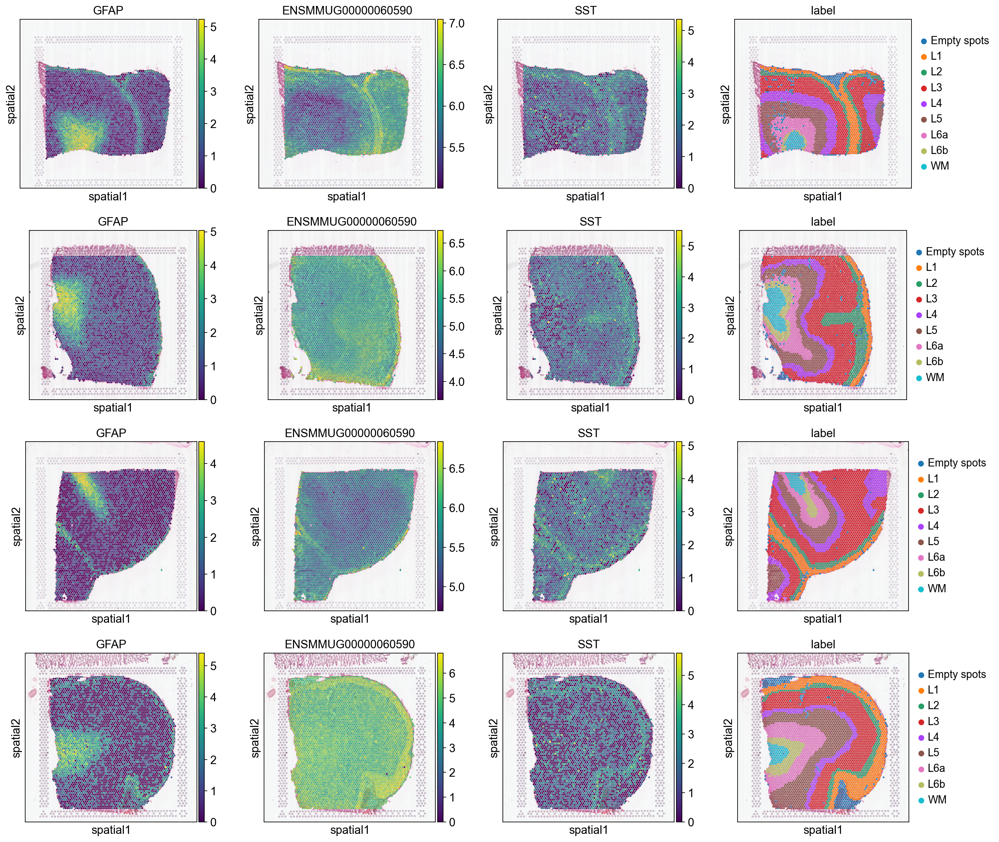

In [24]:
sq.pl.spatial_scatter(adata,
                      color=['GFAP', 'ENSMMUG00000060590', 'SST', 'label'],
                      library_key='sample_id', ncols=4, img=True, size=1.3,
                      save='../figures/markers_human.pdf')